# Taking a quick look on the data

The objective is to quickly gather a series of information on the data we are looking at

In [1]:
import os
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from anytree import Node, RenderTree
from typing import Dict, List

plt.style.use('ggplot')

What are the shapes of the data we are working? 
- We are assuming (30000, 31) for train data and (300, 1259) for target data
- Since test dataset is not labeled we will most likely use a test set and dev set taken from the training set. Selected data should be taken with a specific sampling technique that we will discuss later

In [2]:
training_dataset = '../data/train_data/*'
test_dataset = '../data/test_data/*'


# Access training ids
training_paths_raw = glob(training_dataset)
training_ids_raw = [path.split('/')[-1] for path in training_paths_raw]
training_ids_raw = [path.split('\\')[-1] for path in training_ids_raw]

# Access test ids
test_paths = glob(test_dataset)
test_ids = [path.split('/')[-1] for path in test_paths]
test_ids = [path.split('\\')[-1] for path in test_ids]

print(f'We are working with {len(training_ids_raw)} training examples')
print(f'We are working with {len(test_ids)} test examples')



We are working with 2000 training examples
We are working with 150 test examples


Let us take a look on what is inside each id

In [3]:
training_sample = os.listdir(training_paths_raw[0])
training_sample

['receiver_data_src_1.npy',
 'receiver_data_src_150.npy',
 'receiver_data_src_225.npy',
 'receiver_data_src_300.npy',
 'receiver_data_src_75.npy',
 'vp_model.npy']

--- 
Let us confirm all data has the appropiate shape

In [4]:
for i in range(len(training_paths_raw)):
    assert np.load(os.path.join(training_paths_raw[i], f'receiver_data_src_1.npy')).shape == (10001, 31)
    assert np.load(os.path.join(training_paths_raw[i], f'receiver_data_src_75.npy')).shape == (10001, 31)
    assert np.load(os.path.join(training_paths_raw[i], f'receiver_data_src_150.npy')).shape == (10001, 31)
    assert np.load(os.path.join(training_paths_raw[i], f'receiver_data_src_225.npy')).shape == (10001, 31)
    assert np.load(os.path.join(training_paths_raw[i], f'receiver_data_src_300.npy')).shape == (10001, 31)
    assert np.load(os.path.join(training_paths_raw[i], f'vp_model.npy')).shape == (300, 1259)

In [5]:
RECEIVER_SHAPE = (10001, 31)
VP_MODEL_SHAPE = (300, 1259)

---
Let us find out the data type of every file


In [6]:
training_sample = np.load(os.path.join(training_paths_raw[0], f'receiver_data_src_1.npy'))
target_sample = np.load(os.path.join(training_paths_raw[0], f'vp_model.npy'))
print(f'The dtype of a training instance is: {training_sample.dtype}')
print(f'The dtype of a training label is: {target_sample.dtype}')

The dtype of a training instance is: float32
The dtype of a training label is: float64


Training instances are single float precision, while labels are expected to be double float precision

---
Before comencing exploratory data analysis we must decide strategy on train/test split <br>
While ThinkOnward provides test and train data I will try to engage in a different strategy that will allow us a much easier understanding of the model performance 

---

## Train Test Split

As said before we are working with 2000 training examples and 150 test examples. With this in mind we will follow the next strategy:

- Choosing an split ratio on the training set
- Picking a random seed so our results can be reproducible
- Shuffle our training indices
- Partition into train/validation set
- Sanity check

What are the possible problems with this approach? <br>
- If the dataset gets updated, then the solution will be broken since we will have a new mix of train/validation instances.
- Prone to sampling bias if the chosen validation examples are not representative of the whole training examples.



In [7]:
# Split ratio: 
# 80% -> Training set
# 20% -> Validation set
import numpy as np

def shuffle_and_split_data(data, val_ratio):
    """
    Shuffles a list of folder paths and splits it into training and validation subsets.

    Parameters
    ----------
    data : list of str
        List of folder paths, where each folder contains data samples for training or validation.
    
    val_ratio : float
        The proportion of the data to allocate to the validation set. Must be between 0 and 1.

    Returns
    -------
    train_data : list of str
        Shuffled list of folder paths to be used for training.

    val_data : list of str
        Shuffled list of folder paths to be used for validation.

    Notes
    -----
    A fixed random seed (18) is used for reproducibility.
    """
    np.random.seed(18)
    shuffled_indices = np.random.permutation(len(data))
    val_set_size = int(len(data) * val_ratio)
    val_indices = shuffled_indices[:val_set_size]
    train_indices = shuffled_indices[val_set_size:]
    return  [data[i] for i in train_indices], [data[i] for i in val_indices]

training_ids, validation_ids = shuffle_and_split_data(training_ids_raw, 0.2)


---
Now we need to run a sanity check to see if our approach did not sample bias the train set

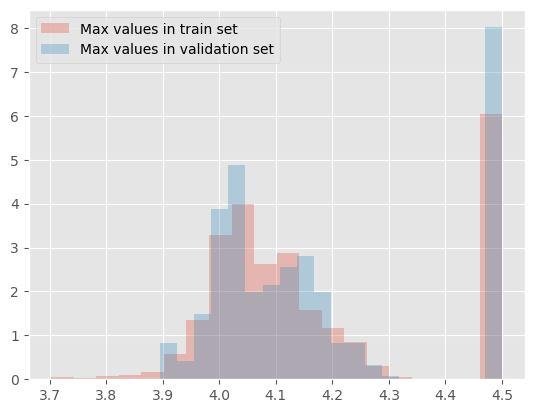

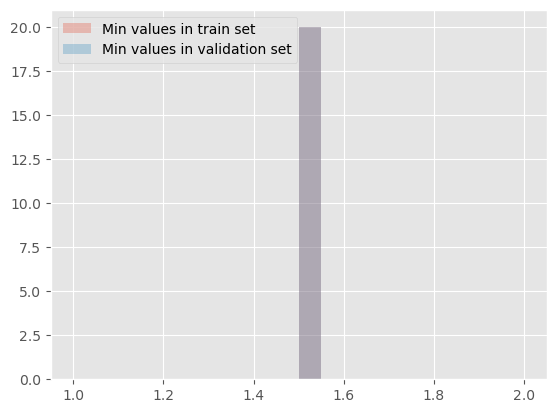

In [8]:
# First we will compute a histogram of our maximum values within each vp_model in the training set vs the validation set
#target_sample = np.load(os.path.join(training_paths_raw[0], f'vp_model.npy'))

def compute_max_velocity(data):
    values = [np.load(f'../data/train_data/{id}/vp_model.npy').max() for id in data]
    return values

def compute_min_velocity(data):
    values = [np.load(f'../data/train_data/{id}/vp_model.npy').min() for id in data]
    return values

def compare_histograms(values: dict, num_bins: int):
    kwargs = dict(histtype = 'stepfilled', alpha = 0.3, density = True, bins = num_bins)
    for title, val in zip(values.keys(), values.values()):
        plt.hist(val, **kwargs, label=title);
    plt.legend()
    plt.show()

        

max_values_train_set = compute_max_velocity(training_ids)
max_values_val_set = compute_max_velocity(validation_ids)

min_values_train_set = compute_min_velocity(training_ids)
min_values_val_set = compute_min_velocity(validation_ids)

compare_histograms(values = {'Max values in train set': max_values_train_set, 'Max values in validation set': max_values_val_set}, num_bins=20)
compare_histograms(values = {'Min values in train set': min_values_train_set, 'Min values in validation set': min_values_val_set}, num_bins=20)



We can observe that the random split did not introduce any skewness to the data, and both histograms containing min and max values look similar. We can confidently move forward with this train/val split. <br>

What can we improve?
- Compare the mean and standard deviation and compare distributions
- Approximate finite differences and compute a mean absolute gradient per split
- For each shot calculate RMS amplitude and compare train/val histograms
- **Peak amplitude, I Believe this is worth persuing**: Track max(|d|) per gather. If val has far higher peaks, it may represent stronger reflections (i.e. different geology).
- Kolmogorov-Smirnov on mean vp

---

## Exploratory Data Analysis

We will now work with a copy of the training split to try to find out more information about the data <br>
Our strategy for this section:
1. Univariate summaries:
    - Shot-Gather inputs
        - Mean, standard deviation, RMS, skewness and kurtosis across all time-reciever samples in order to reveal overall signal strength, noise levels and outliers
        - Compute the analytic signal envelope per gather to see where energy is concentrated in time (early vs late arrivals)
        - FFT of individual traces
    - Velocity-Model Targets
        - Histograms of vp values in order to tell typical velocity ranges (sediment vs. basement)
        - Spatial gradients
2. Bivariate and Correlation Analysis:
    - Input vs Target correlation:
        - Rms amplitude correlation with global vp statistics, with the hope of finding insights on amplitude and high velocity zones
    - Cross-plot:
        - For all samples scatter mean shot frequency against model gradient
3. Spacial and Image-Based exploration:
    - Shot-Gather:
        - Common-Midpoint (CMP) fold
    - Velocity Maps:
        - Layer slicing
        - Vertical cross-sections
4. Multivariate & Dimensionality reduction:
    - PCA on descriptors, compute descriptors for each sample and embed in 2D, with the hope of clustering and finding natural groupings
    - Clustering on those descriptors and defining 'prototypes' of geological scenarios, if done we need to ensure to represent these clusters well in train/validation split
5. Geophysical-Specific Attributes:
    - Semblance Analysis:
        - Semblance panels on synthetic gathers, looking for a high semblance to indciate coherent reflectors
        - Compare against known layer tops in vp to validate my forward modeling
    - First-break picking:
        - Automatically pick first arrivals and build a simple time-depth curve, inversion should honor the curve so it is useful as a sanity check
    - Fault & Anomaly detection:
        - Run Sobel edge-detection on vp maps to highlight velocity discontinuities
        - Check against known faultsin the synthetic models


---
1. Univariate summaries <br>
 Shot-gather inputs

- Mean, standard deviation, RMS, skewness and kurtosis across all time-reciever samples in order to reveal overall signal strength, noise levels and outliers

In [9]:
# New approach using only 2 numpy array and invoking different axes for disctinct operations
# One array contains all information regarding inputs, while the other contains the labels
def load_data_array(sample_ids: list, receiver_ids: list = [1, 75, 150, 225, 300], receiver_shape: tuple = (10001, 31), model_shape: tuple = (300, 1259)):
    """
    Loads seismic input data and corresponding velocity model labels into NumPy arrays.

    Parameters
    ----------
    sample_ids : list of str
        List of sample IDs to load (each corresponding to a folder under ./data/train_data/).

    receiver_ids : list of int, optional
        List of source positions to load seismic data from. Each ID corresponds to a file named
        'receiver_data_src_{id}.npy'. Default is [1, 75, 150, 225, 300].

    receiver_shape : tuple of int, optional
        Expected shape of each individual receiver data file. Default is (10001, 31), where
        10001 is the number of time steps and 31 is the number of receivers.

    model_shape : tuple of int, optional
        Shape of the velocity model (label) per sample. Default is (300, 1259), where
        300 is the horizontal axis and 1259 is the depth axis.

    Returns
    -------
    data : np.ndarray
        Array of shape (num_samples, num_receivers, time_steps, num_channels) containing seismic input data.

    labels : np.ndarray
        Array of shape (num_samples, model_shape[0], model_shape[1]) containing velocity model labels.

    Notes
    -----
    This function assumes that the directory structure follows:
        ./data/train_data/{sample_id}/receiver_data_src_{receiver_id}.npy
        ./data/train_data/{sample_id}/vp_model.npy
    and that all files exist and match the expected shape.
    """
    
    num_samples = len(sample_ids)
    num_receivers = len(receiver_ids)

    result = np.zeros((num_samples, num_receivers, receiver_shape[0], receiver_shape[1]), dtype=np.float32)
    result2 = np.zeros((num_samples, model_shape[0], model_shape[1]))

    for i, sample_id in enumerate(sample_ids):
        for j, receiver_id in enumerate(receiver_ids):
            arr = np.load(f'../data/train_data/{sample_id}/receiver_data_src_{receiver_id}.npy')
            arr2 = np.load(f'../data/train_data/{sample_id}/vp_model.npy')
            result[i, j, :, :] = arr
            result2[i, :, :] = arr2
    return result, result2

data, labels = load_data_array(sample_ids=training_ids[:160])
#data, labels = load_data_array(sample_ids=training_ids)

In [10]:
print(f'The loaded data has shape: {data.shape} \n{data.shape[0]} is the number of samples\n{data.shape[1]} is the shot\n{data.shape[2]} is the time\n{data.shape[3]} is the receiver')
print('--------------------------')
print(f'The loaded labels has shape: {labels.shape} \n{labels.shape[0]} is the number of samples\n{labels.shape[1]} is the horizontal axis\n{labels.shape[2]} is the vertical axis')

The loaded data has shape: (160, 5, 10001, 31) 
160 is the number of samples
5 is the shot
10001 is the time
31 is the receiver
--------------------------
The loaded labels has shape: (160, 300, 1259) 
160 is the number of samples
300 is the horizontal axis
1259 is the vertical axis


In [11]:
def compute_global_metrics(data):
    """
    Computes global statistical metrics (mean, standard deviation, and RMS) across all samples, 
    along with their skewness and kurtosis.

    Parameters
    ----------
    data : np.ndarray
        A 4D NumPy array of shape (num_samples, num_receivers, time_steps, channels), where:
        - axis 0: sample index
        - axis 1: receiver/source index
        - axis 2: time steps
        - axis 3: receivers or channels

    Returns
    -------
    mean_metrics : tuple
        A tuple containing:
        - overall_mean_values : np.ndarray of shape (num_samples,)
            Mean amplitude per sample.
        - mean_skew : float
            Skewness of the sample-wise mean values.
        - mean_kurtosis : float
            Kurtosis of the sample-wise mean values.

    std_metrics : tuple
        A tuple containing:
        - overall_standard_deviation_values : np.ndarray of shape (num_samples,)
            Standard deviation per sample.
        - std_skew : float
            Skewness of the sample-wise standard deviation values.
        - std_kurtosis : float
            Kurtosis of the sample-wise standard deviation values.

    rms_metrics : tuple
        A tuple containing:
        - overall_rms_values : np.ndarray of shape (num_samples,)
            Root mean square amplitude per sample.
        - rms_skew : float
            Skewness of the sample-wise RMS values.
        - rms_kurtosis : float
            Kurtosis of the sample-wise RMS values.

    Notes
    -----
    - This function computes metrics sample-wise by collapsing the last three axes.
    - Skewness and kurtosis are computed using `scipy.stats`.
    - Full computation may take several minutes depending on dataset size (~6 minutes for large datasets).
    """
    from scipy.stats import skew, kurtosis

    overall_mean_values = data.mean(axis=(1,2,3))
    overall_standard_deviation_values = data.std(axis=(1,2,3))
    overall_rms_values = np.sqrt((data**2).mean(axis = (1,2,3)))

    mean_skew = skew(overall_mean_values)
    std_skew = skew(overall_standard_deviation_values)
    rms_skew = skew(overall_rms_values)

    mean_kurtosis = kurtosis(overall_mean_values)
    std_kurtosis = kurtosis(overall_standard_deviation_values)
    rms_kurtosis = kurtosis(overall_rms_values)

    return (overall_mean_values, mean_skew, mean_kurtosis), (overall_standard_deviation_values, std_skew, std_kurtosis), (overall_rms_values, rms_skew, rms_kurtosis)

In [12]:
global_mean_values, global_std_values, global_rms_values = compute_global_metrics(data) 
global_mean, global_mean_skew, global_mean_kurtosis = global_mean_values
global_std, global_std_skew, global_std_kurtosis = global_std_values
global_rms, global_rms_skew, global_rms_kurtosis = global_rms_values

print(global_rms_kurtosis)
print(global_std_kurtosis)

print(global_rms_skew)
print(global_std_skew)

39.88380634062407
39.88092852390615
5.39345430000816
5.393051065394949


In [13]:
import matplotlib.pyplot as plt

def compute_global_histograms(values: dict, num_bins: int, skew, kurtosis):
    """
    Plots overlaid histograms of given value distributions, with skewness and kurtosis annotated.

    Parameters
    ----------
    values : dict
        Dictionary where keys are labels (e.g. 'Mean', 'Std Dev', 'RMS') and values are 1D NumPy arrays.
    num_bins : int
        Number of bins for the histogram.
    skew : float
        Skewness value to annotate.
    kurtosis : float
        Kurtosis value to annotate.
    """
    kwargs = dict(histtype='stepfilled', alpha=0.3, density=True, bins=num_bins)
    textstr = f"Skewness: {skew:.2f}\nKurtosis: {kurtosis:.2f}"
    props = dict(boxstyle='round', facecolor='white', alpha=0.8)

    fig, ax = plt.subplots(figsize=(8, 4))
    for title, val in values.items():
        ax.hist(val, **kwargs, label=title)

    ax.text(0.95, 0.75, textstr, transform=ax.transAxes,
            fontsize=12, verticalalignment='top', horizontalalignment='right',
            bbox=props)

    ax.set_title("Global Distributions")
    ax.set_xlabel("Value")
    ax.set_ylabel("Density")
    ax.legend()
    plt.tight_layout()
    plt.show()

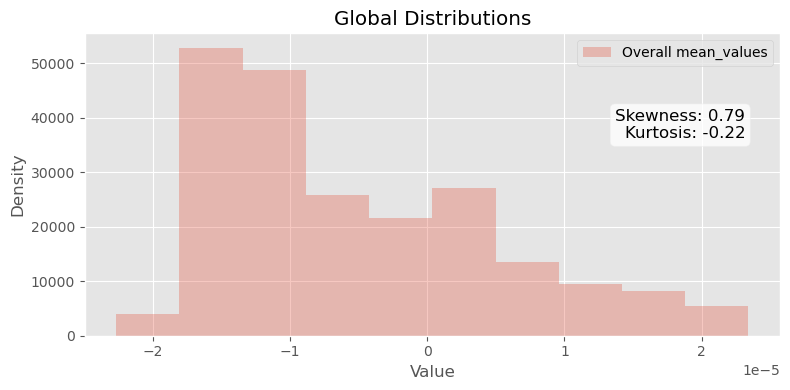

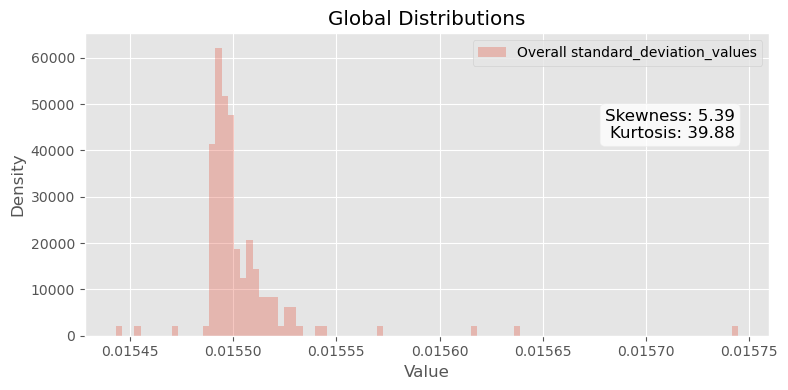

In [14]:
compute_global_histograms(values = {'Overall mean_values': global_mean}, num_bins=10,skew= global_mean_skew, kurtosis=global_mean_kurtosis)
compute_global_histograms(values = {'Overall standard_deviation_values': global_std}, num_bins=100, skew = global_std_skew, kurtosis=global_std_kurtosis )

- Analytic signal envelope per gather to see where energy is concentrated in time (early vs late arrivals)


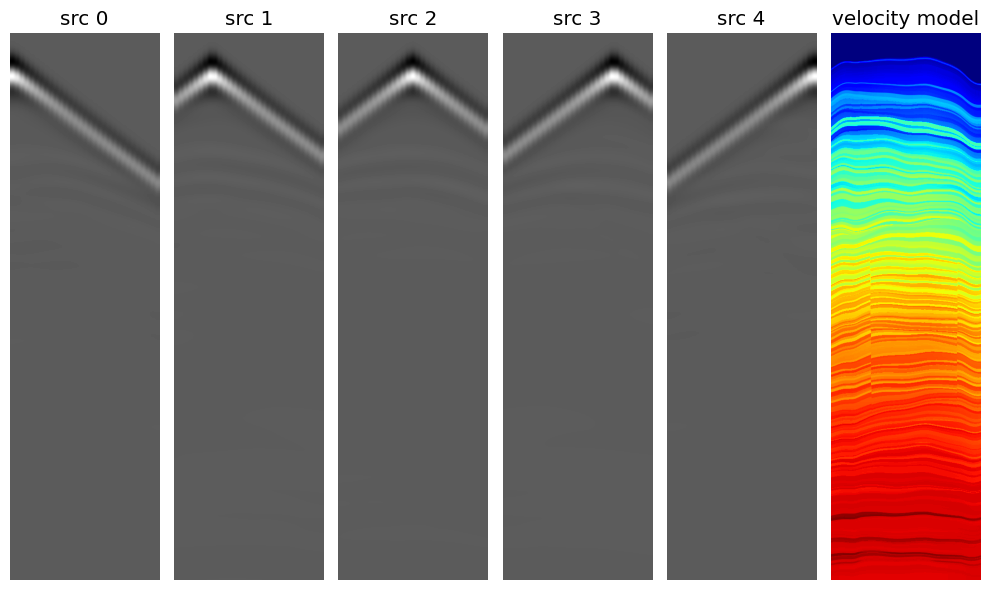

In [15]:
# Plot one dataset sample
def plot_sample():
    sample_path = training_ids[0]

    source_coordinates = [1, 75, 150, 225, 300]

    f, ax = plt.subplots(1, 6, figsize=(10, 6))

    for i, s in enumerate(source_coordinates):
        rec_data = np.load(os.path.join(f"../data/train_data/{sample_path}/receiver_data_src_{s}.npy"))
        ax[i].imshow(rec_data, cmap="gray", aspect="auto")
        ax[i].set_title(f"src {i}")
        ax[i].axis("off")

    target_data = np.load(os.path.join(f"../data/train_data/{sample_path}/vp_model.npy"))
    ax[-1].imshow(target_data.T, cmap="jet", aspect="auto")
    ax[-1].set_title("velocity model")
    ax[-1].axis("off")

    plt.tight_layout()
    plt.show()

plot_sample()

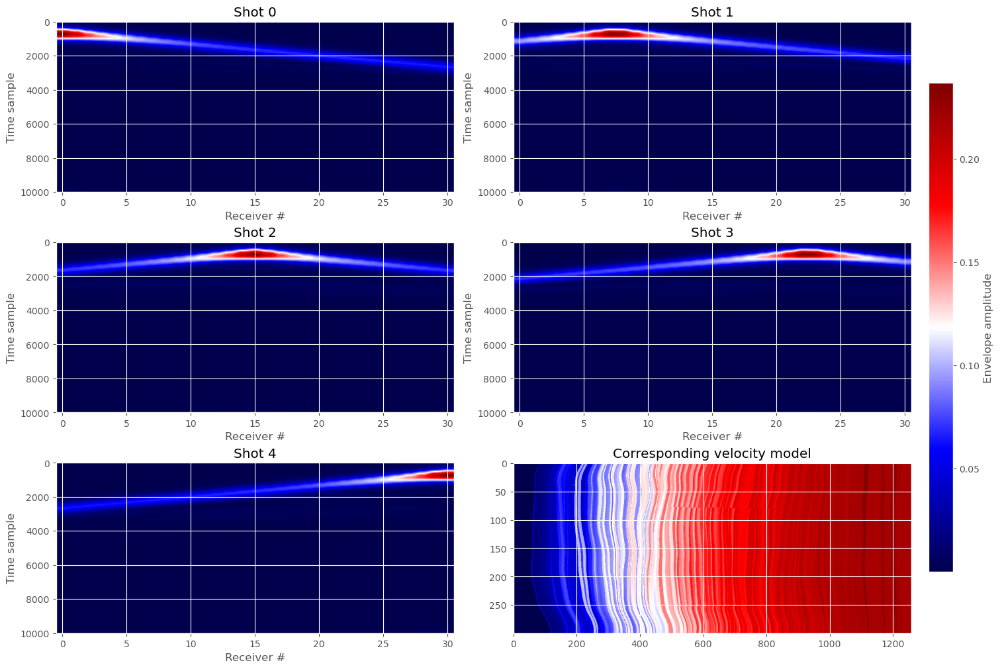

In [16]:
# Plot E(t) for the first shot at the first sample


def plot_shot(data: np.ndarray, method: str = 'single_shot'):
    if method == 'single_shot':
        data = data[0, 0, :, :]
        print(data.shape)
        plt.imshow(data, aspect='auto', cmap='seismic')
        plt.show()

def plot_envelope(data: np.ndarray, labels: np.ndarray, method='single_sample'):
    from scipy.signal import hilbert
    if method == 'single_receiver':
        x_t = data[0, 0, :, 0]
        ax_t = np.real(hilbert(x_t)) + np.imag(hilbert(x_t))
        return abs(ax_t)
    if method == 'single_shot':
        x_t = data[0, 0, :, :]
        analytic = abs((hilbert(x_t, axis=0)))
        plt.imshow(analytic, aspect='auto', cmap='seismic')
        return analytic
    if method == 'single_sample':
        sample_number = 0
        label = labels[sample_number, :, :]
        fig, axs = plt.subplots(3,2, figsize = (15, 10), constrained_layout = True)
        axs = axs.ravel()
        n_shots = 5
        for i in range(n_shots):
            x_t = data[sample_number, i, :, :]
            analytic = abs((hilbert(x_t, axis=0)))
            im = axs[i].imshow(analytic, aspect='auto', cmap='seismic')
            axs[i].set_title(f'Shot {i}')
            axs[i].set_xlabel('Receiver #')
            axs[i].set_ylabel('Time sample')

        # Plot corresponding velocity model
        axs[5].imshow(label, aspect = 'auto', cmap = 'seismic')
        axs[5].set_title('Corresponding velocity model')


        cbar = fig.colorbar(im,
                    ax=axs.ravel().tolist(),
                    orientation='vertical',
                    label='Envelope amplitude',
                    shrink=0.8,   # make it a bit shorter
                    pad=0.02)     # small gap to axes

# What can we improve? -> We can compute the envelope for all the dataset and then plot the averages of each shot.
test = plot_envelope(data, labels)
test

FFT of individual traces

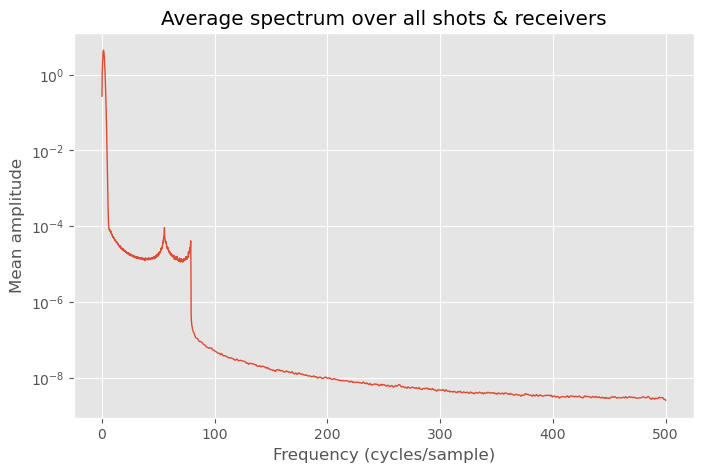

In [17]:
import numpy as np
import matplotlib.pyplot as plt

def plot_average_spectrum(data: np.ndarray):
    """
    Compute and plot the average FFT magnitude (with DC removed + Hanning window)
    over all samples, shots and receivers in `data`, which is shaped
    (n_samples, n_shots, n_time, n_receivers).
    """
    n_samples, n_shots, n_time, n_receivers = data.shape

    # normalized frequency axis (cycles/sample)
    freqs = np.fft.rfftfreq(n_time, d=0.001)
    n_freq = n_time // 2 + 1

    # allocate array for all spectra
    all_specs = np.empty((n_samples, n_shots, n_receivers, n_freq))

    for s in range(n_samples):
        for sh in range(n_shots):
            for r in range(n_receivers):
                trace = data[s, sh, :, r]
                # 1) remove DC
                trace_dc = trace - trace.mean()
                # 2) taper
                windowed = trace_dc * np.hanning(n_time)
                # 3) FFT + magnitude
                X = np.fft.rfft(windowed)
                all_specs[s, sh, r, :] = np.abs(X)

    # average across samples, shots, receivers
    mean_spec = all_specs.mean(axis=(0, 1, 2))

    # plot on log-y scale
    plt.figure(figsize=(8, 5))
    plt.semilogy(freqs, mean_spec, linewidth=1)
    plt.xlabel('Frequency (cycles/sample)')
    plt.ylabel('Mean amplitude')
    plt.title('Average spectrum over all shots & receivers')
    plt.grid(True)
    plt.show()

plot_average_spectrum(data)


---

Velocity-Model Targets:
- Histograms of vp values in order to tell typical velocity ranges (sediment vs. basement)


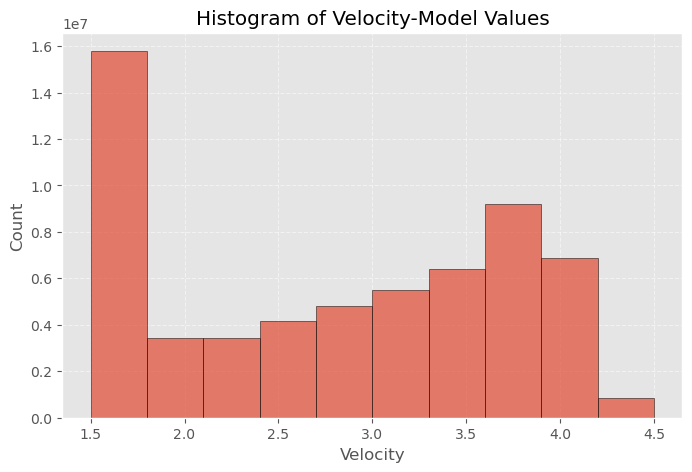

In [18]:
import numpy as np
import matplotlib.pyplot as plt

def plot_vp_values(labels: np.ndarray, bins: int = 50):
    """
    labels: array of shape (n_samples, nx, ny) holding velocity values
    bins:   number of bins in the histogram
    """
    # flatten everything into a 1-D vector
    values = labels.ravel()

    plt.figure(figsize=(8, 5))
    plt.hist(values,
             bins=bins,
             edgecolor='black',
             alpha=0.7)
    plt.xlabel('Velocity')
    plt.ylabel('Count')
    plt.title('Histogram of Velocity-Model Values')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

def plot_vp_hist_per_sample(labels: np.ndarray, bins: int = 50):
    """
    Plot one histogram of velocity values for each sample in `labels`.
    labels.shape = (n_samples, nx, ny)
    """
    n_samples = labels.shape[0]
    fig, axs = plt.subplots(1, n_samples, figsize=(4*n_samples, 4), sharey=True)

    for i in range(n_samples):
        vals = labels[i].ravel()
        axs[i].hist(vals, bins=bins, edgecolor='black', alpha=0.7)
        axs[i].set_title(f"Sample {i}")
        axs[i].set_xlabel("Velocity")
        if i == 0:
            axs[i].set_ylabel("Count")

    plt.tight_layout()
    plt.show()


# Usage
plot_vp_values(labels, bins=10)


Spatial gradients

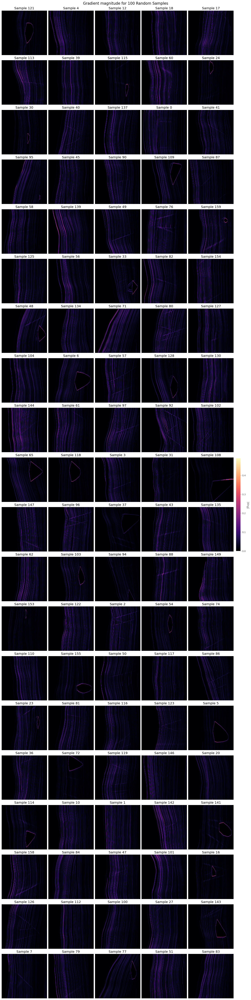

In [19]:
def plot_random_gradients(labels: np.ndarray, n_plots: int = 10, seed: int = 18):
    """
    Pick `n_plots` random samples from `labels` (shape [n_samples, nx, ny]),
    compute the gradient magnitude of each (via np.gradient), and plot them
    """
    n_samples, nx, ny = labels.shape
    np.random.seed(seed)
    indices = np.random.choice(n_samples, size=n_plots, replace=False)

    n_cols = min(5, n_plots)
    n_rows = (n_plots + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize = (3*n_cols, 3*n_rows), constrained_layout = True)
    axes = axes.ravel()

    for ax, idx in zip(axes, indices):
        vp = labels[idx] # (nx, ny)
        gx, gy = np.gradient(vp)
        grad = np.sqrt(gx**2 + gy**2)

        im = ax.imshow(grad, cmap = 'magma', aspect = 'auto')
        ax.set_title(f'Sample {idx}')
        ax.axis('off')

    # Hide any unused subplots
    for ax in axes[len(indices):]:
        ax.axis('off')

    # Single shared colorbar
    cbar = fig.colorbar(im, ax = axes.tolist(), orientation = 'vertical', fraction = 0.02, pad = 0.01)
    cbar.set_label('|∇vp|')

    plt.suptitle(f'Gradient magnitude for {n_plots} Random Samples', fontsize = 16)
    plt.show()

plot_random_gradients(labels, n_plots=100)

---

2. Bivariate and Correlation Analysis:
    - Input vs Target correlation:
        - Rms amplitude correlation with global vp statistics, with the hope of finding insights on amplitude and high velocity zones

In [20]:
def correlation_rms_env(data: np.ndarray, labels: np.ndarray, method: str):
    import pandas as pd
    from scipy.stats import pearsonr, spearmanr
    from scipy.signal import hilbert
    n_samples, n_shots, n_time, n_recv = data.shape

    rows = []
    if method == 'overall':
        for s in range(n_samples):
            # 1) RMS amplitude over ALL shots and receivers
            amp = data[s]                   # shape (n_shots, n_time, n_recv)
            A_s = np.sqrt((amp**2).mean())  # Single number

            traces = amp.reshape(-1, n_time)    # shape (n_shots * n_recv, n_time)
            # Analytic envelope per trace, then mean
            envs = np.abs(hilbert(traces, axis = 1))
            env_mean = envs.mean()

            # 2) VP summaries
            vp = labels[s].ravel()
            mean_s = vp.mean()
            median_s = np.median(vp)
            std_s = vp.std()
            max_s = vp.max()

            rows.append({
                'sample': s,
                'rms_amp': A_s,
                'env_mean': env_mean,
                'vp_mean': mean_s,
                'vp_median': median_s,
                'vp_std': std_s,
                'vp_max': max_s
            })
        
        df = pd.DataFrame(rows)

        for feat in ['rms_amp', 'env_mean']:
            for target in ['vp_mean','vp_median','vp_std','vp_max']:
                r_p, p_p = pearsonr(df[feat], df[target])
                r_s, p_s = spearmanr(df[feat], df[target])
                print(f"{feat:<10} vs {target:<7}  "
                    f"Pearson r={r_p: .3f} (p={p_p:.3g}),  "
                    f"Spearman ρ={r_s: .3f} (p={p_s:.3g})")

        return df
    
df_stats = correlation_rms_env(data, labels, 'overall')
df_stats.head()



rms_amp    vs vp_mean  Pearson r= 0.402 (p=1.39e-07),  Spearman ρ= 0.538 (p=2.11e-13)
rms_amp    vs vp_median  Pearson r= 0.392 (p=2.99e-07),  Spearman ρ= 0.537 (p=2.4e-13)
rms_amp    vs vp_std   Pearson r=-0.320 (p=3.74e-05),  Spearman ρ=-0.223 (p=0.00459)
rms_amp    vs vp_max   Pearson r= 0.066 (p=0.404),  Spearman ρ= 0.188 (p=0.017)
env_mean   vs vp_mean  Pearson r= 0.507 (p=7.62e-12),  Spearman ρ= 0.514 (p=3.74e-12)
env_mean   vs vp_median  Pearson r= 0.515 (p=3.17e-12),  Spearman ρ= 0.517 (p=2.57e-12)
env_mean   vs vp_std   Pearson r=-0.132 (p=0.0952),  Spearman ρ=-0.217 (p=0.00595)
env_mean   vs vp_max   Pearson r= 0.096 (p=0.226),  Spearman ρ= 0.169 (p=0.0328)


,sample,rms_amp,env_mean,vp_mean,vp_median,vp_std,vp_max
0,0,0.015745,0.007064,3.204389,3.462092,0.803887,4.249033
1,1,0.015495,0.006735,2.835420,3.003986,0.916999,4.040384
2,2,0.015493,0.006741,2.617908,2.734500,0.910979,4.002007
3,3,0.015499,0.006835,2.793730,2.985925,0.931449,4.117170
4,4,0.015636,0.006898,3.064622,3.295927,0.863298,4.238328


Scatter + Regression line for rms_amp vs vp_mean


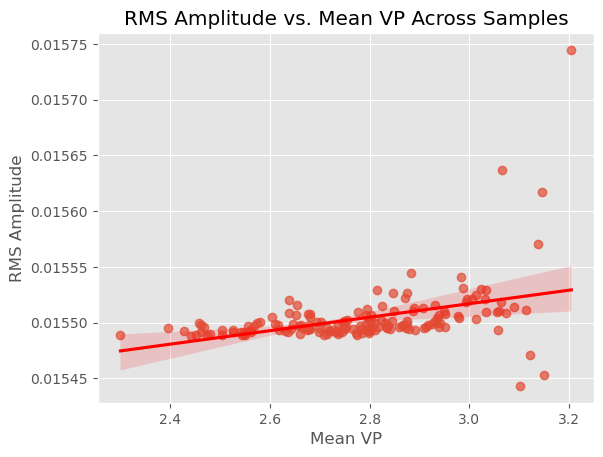

In [21]:
def rms_vp(df: pd.DataFrame):
    import matplotlib.pyplot as plt
    import seaborn as sns

    sns.regplot(x = 'vp_mean', y = 'rms_amp', data=df, scatter_kws={'alpha': 0.7}, line_kws={'color': 'red'})
    plt.xlabel('Mean VP')
    plt.ylabel('RMS Amplitude')
    plt.title('RMS Amplitude vs. Mean VP Across Samples')
    plt.show()

rms_vp(df_stats)

Scatter + Regression line for envelope mean vs vp_mean

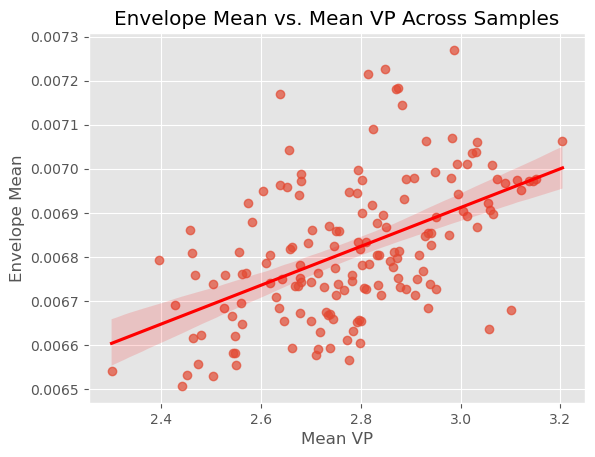

In [22]:
def env_vp(df: pd.DataFrame):
    import matplotlib.pyplot as plt
    import seaborn as sns

    sns.regplot(x = 'vp_mean', y = 'env_mean', data=df, scatter_kws={'alpha': 0.7}, line_kws={'color': 'red'})
    plt.xlabel('Mean VP')
    plt.ylabel('Envelope Mean')
    plt.title('Envelope Mean vs. Mean VP Across Samples')
    plt.show()

env_vp(df_stats)

---

- Cross-plot:
- For all samples scatter mean shot frequency against model gradient

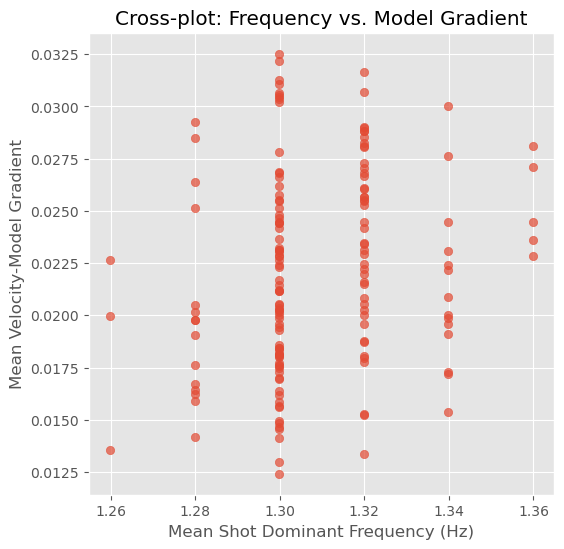

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

def crossplot_freq_vs_gradient(data: np.ndarray,
                                labels: np.ndarray,
                                fs: float = 1000):
    """
    data:   shape (n_samples, n_shots, n_time, n_recv)
    labels: shape (n_samples, nx, ny)
    fs:     sampling rate (Hz) or 1.0 for normalized frequencies
    """
    n_samples, n_shots, n_time, n_recv = data.shape

    # precompute frequency axis
    freqs = np.fft.rfftfreq(n_time, d=1.0/fs)

    mean_shot_freqs = np.zeros(n_samples)
    mean_model_grads = np.zeros(n_samples)

    for s in range(n_samples):
        dom_freqs = []
        # 1) per-shot dominant frequencies
        for sh in range(n_shots):
            gather = data[s, sh]             # shape (n_time, n_recv)
            # average traces → one mean trace, or average spectra:
            spec = np.abs(np.fft.rfft(gather, axis=0))  # shape (n_freq, n_recv)
            spec_mean = spec.mean(axis=1)    # mean over receivers
            dom_bin = np.argmax(spec_mean)
            dom_freqs.append(freqs[dom_bin])

        mean_shot_freqs[s] = np.mean(dom_freqs)

        # 2) per-sample mean gradient magnitude of vp model
        vp = labels[s]
        gx, gy = np.gradient(vp)
        grad_mag = np.sqrt(gx**2 + gy**2)
        mean_model_grads[s] = grad_mag.mean()

    # 3) scatter cross-plot
    plt.figure(figsize=(6,6))
    plt.scatter(mean_shot_freqs, mean_model_grads, alpha=0.7)
    plt.xlabel('Mean Shot Dominant Frequency (Hz)')
    plt.ylabel('Mean Velocity-Model Gradient')
    plt.title('Cross-plot: Frequency vs. Model Gradient')
    plt.grid(True)
    plt.show()


crossplot_freq_vs_gradient(data, labels)


---

Multivariate embedding and clustering

c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


,sample_id,mean_amp,std_amp,rms_amp,env_mean,dom_freq,grad_mean,pca1,pca2,cluster
0,xg4xYJNcyfyEESaBvO,0.000006,0.015745,0.015745,0.007064,0.00130,0.027838,0.005741,0.000252,1
1,2UuAtfRqPxYCwIpqdF,-0.000008,0.015495,0.015495,0.006735,0.00130,0.012987,-0.009112,-0.000021,0
2,aOO9h81qT4llCjRP20,-0.000013,0.015493,0.015493,0.006741,0.00130,0.021473,-0.000625,-0.000072,0
3,Y51Q89RFioOOdN76J5,-0.000013,0.015499,0.015499,0.006835,0.00128,0.026369,0.004270,-0.000010,1
4,gCTIkSZQkFM7Oj8qPQ,0.000014,0.015636,0.015636,0.006898,0.00128,0.016413,-0.005684,0.000143,0


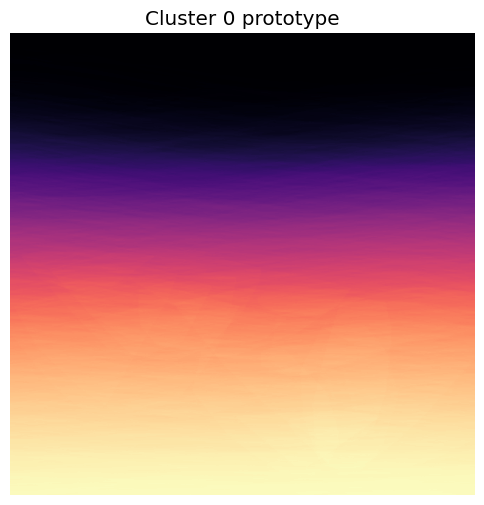

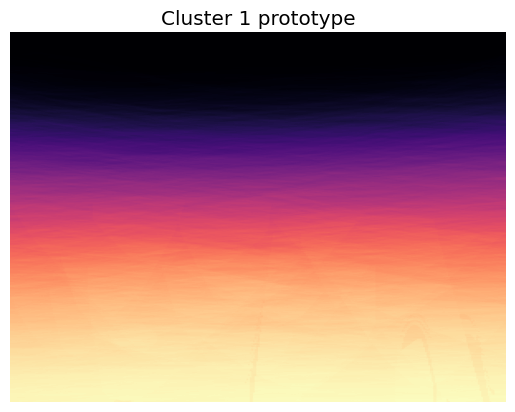

In [29]:
def multivariate_embedding_clustering(
        data: np.ndarray,
        labels: np.ndarray,
        sample_ids: list,
        n_clusters: int = 4,
        n_components: int = 2,
        random_state: int = 18
    ):
    import numpy as np
    import pandas as pd
    from scipy.signal import hilbert
    from sklearn.decomposition import PCA
    from sklearn.cluster import KMeans
    import matplotlib.pyplot as plt
    """
    Computes per-sample descriptors, reduces them to a low-dimensional embedding,
    performs clustering, and returns both the descriptor DataFrame and prototypes.

    Parameters
    ----------
    data : np.ndarray
        Shape (n_samples, n_shots, n_time, n_receivers) - seismic gathers.
    labels : np.ndarray
        Shape (n_samples, nx, ny) - velocity models.
    sample_ids : list of str
        Identifiers for each sample, length == n_samples.
    n_clusters : int
        Number of clusters for K-means.
    n_components : int
        Number of components for PCA embedding.
    random_state : int
        Random seed for reproducibility.

    Returns
    -------
    df : pd.DataFrame
        Columns: ['sample_id','mean_amp','std_amp','rms_amp','env_mean',
                  'dom_freq','grad_mean','pca1',...,'pca{n_components}','cluster']
    prototypes : dict
        Mapping cluster_label -> average vp-model (np.ndarray of shape (nx, ny)).
    """

    n_samples, n_shots, n_time, n_recv = data.shape
    freqs = np.fft.rfftfreq(n_time, d=1.0)

    # --- 1) Compute descriptors
    records = []
    for i in range(n_samples):
        amp = data[i]
        mean_amp = amp.mean()
        std_amp = amp.std()
        rms_amp = np.sqrt((amp ** 2).mean())

        # Envelope mean
        traces = amp.reshape(-1, n_time)
        env_mean = np.abs(hilbert(traces, axis=1)).mean()

        # Dominant frequency
        doms = []
        for shot in range(n_shots):
            X = np.abs(np.fft.rfft(amp[shot], axis=0))
            doms.append(freqs[np.argmax(X.mean(axis=1))])
        dom_freq = np.mean(doms)

        # Gradient mean of vp-model
        gx, gy = np.gradient(labels[i])
        grad_mean = np.sqrt((gx**2 + gy**2)).mean()

        records.append({
            'sample_id': sample_ids[i],
            'mean_amp': mean_amp,
            'std_amp': std_amp,
            'rms_amp': rms_amp,
            'env_mean': env_mean,
            'dom_freq': dom_freq,
            'grad_mean': grad_mean
        })

    df = pd.DataFrame(records)

    # --- 2) Embedding with PCA
    features = ['mean_amp', 'std_amp', 'rms_amp', 'env_mean', 'dom_freq', 'grad_mean']
    pca = PCA(n_components=n_components, random_state=random_state)
    coords = pca.fit_transform(df[features])
    for dim in range(n_components):
        df[f'pca{dim+1}'] = coords[:, dim]

    # --- 3) Clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    df['cluster'] = kmeans.fit_predict(coords)

    # --- 4) Compute prototypes
    prototypes = {}
    for c in sorted(df['cluster'].unique()):
        idxs = df[df['cluster'] == c].index
        prototypes[c] = labels[idxs].mean(axis=0)

    return df, prototypes
    
df, prototypes = multivariate_embedding_clustering(data, labels, training_ids, n_clusters=2)
display(df.head())
plt.figure(figsize=(6, 6))
for c, proto in prototypes.items():
    plt.imshow(proto.T, aspect='auto', cmap='magma'); plt.title(f'Cluster {c} prototype'); plt.axis('off'); plt.show()


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Window

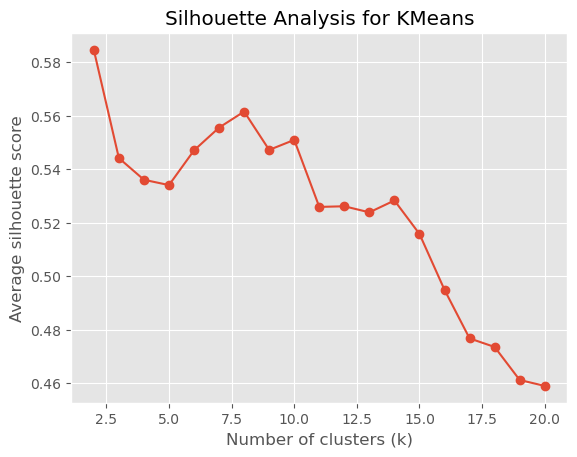

Silhouette scores by k: {2: 0.584676922899168, 3: 0.544229987684643, 4: 0.5361250497728112, 5: 0.5341307905299557, 6: 0.5471129274519997, 7: 0.5556261368107548, 8: 0.5616260343425894, 9: 0.5472845373673288, 10: 0.551034312939809, 11: 0.5259712428975152, 12: 0.5262135750163593, 13: 0.5239418249533401, 14: 0.5283781834048134, 15: 0.5158611725012825, 16: 0.49495364007214643, 17: 0.4768039368074838, 18: 0.47359881986537555, 19: 0.46125206640388255, 20: 0.45903277347567056}


In [26]:
# Silhouette analysis
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def silhouette_analysis(df, features, k_min=2, k_max=10, random_state=0):
    """
    Performs silhouette analysis for KMeans clustering on the given feature set.
    
    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing descriptor features.
    features : list of str
        List of column names in df to use for clustering.
    k_min : int
        Minimum number of clusters to evaluate.
    k_max : int
        Maximum number of clusters to evaluate.
    random_state : int
        Random seed for reproducibility.
    
    Returns
    -------
    scores : dict
        Mapping from k to average silhouette score.
    """
    X = df[features].values
    ks = list(range(k_min, k_max + 1))
    scores = []
    for k in ks:
        km = KMeans(n_clusters=k, random_state=random_state)
        labels = km.fit_predict(X)
        score = silhouette_score(X, labels)
        scores.append(score)
    
    plt.figure()
    plt.plot(ks, scores, marker='o')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Average silhouette score')
    plt.title('Silhouette Analysis for KMeans')
    plt.grid(True)
    plt.show()
    
    return dict(zip(ks, scores))

# Example usage:
features = ['mean_amp', 'std_amp', 'rms_amp', 'env_mean', 'dom_freq', 'grad_mean']
sil_scores = silhouette_analysis(df, features, k_min=2, k_max=20)
print("Silhouette scores by k:", sil_scores)


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


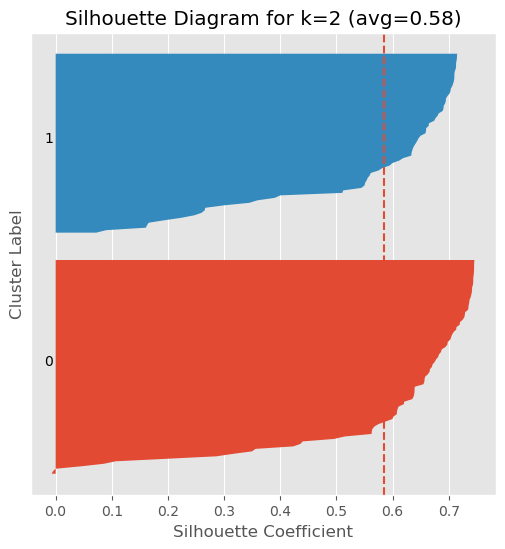

c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Average silhouette score for k=2: 0.585


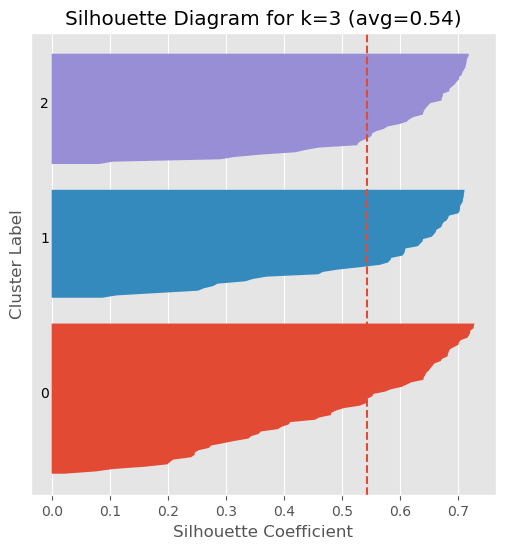

Average silhouette score for k=3: 0.544


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


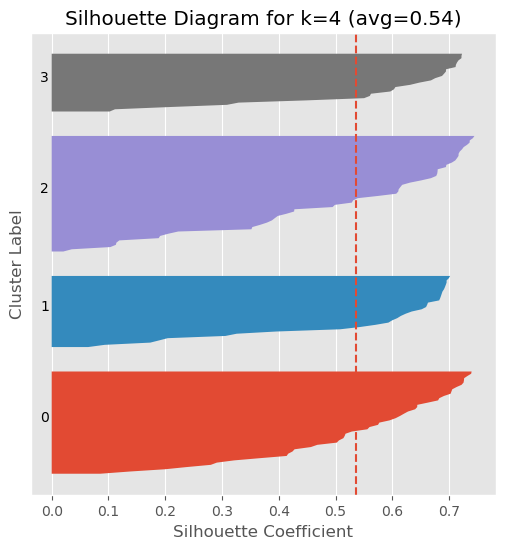

Average silhouette score for k=4: 0.536


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


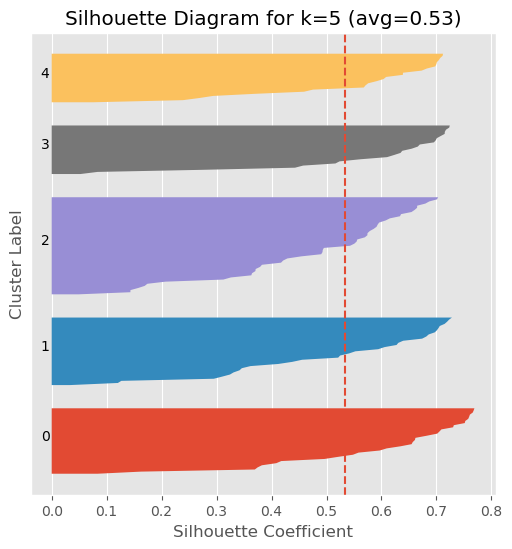

Average silhouette score for k=5: 0.534


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


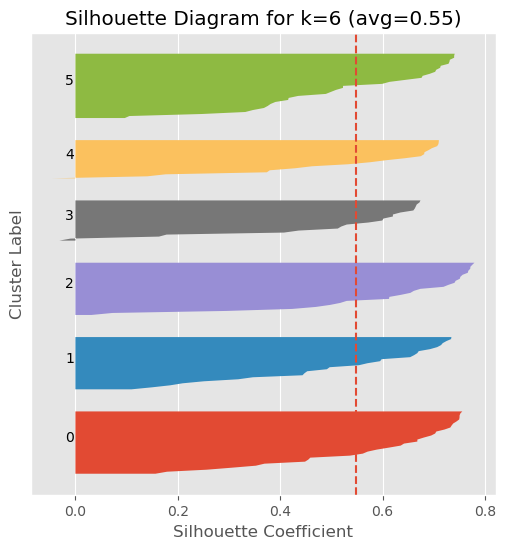

Average silhouette score for k=6: 0.547


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


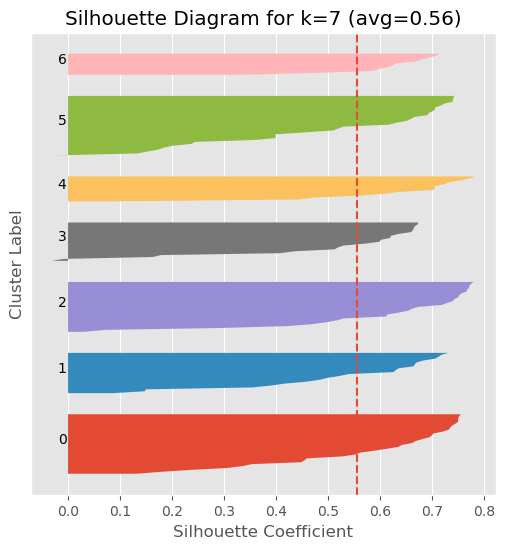

Average silhouette score for k=7: 0.556


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


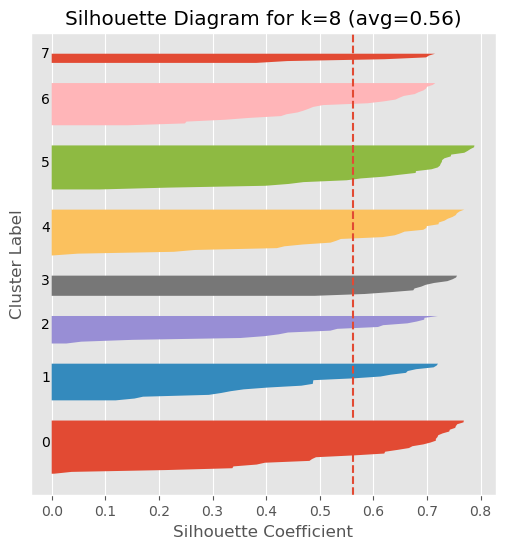

Average silhouette score for k=8: 0.562


c:\Users\berny\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


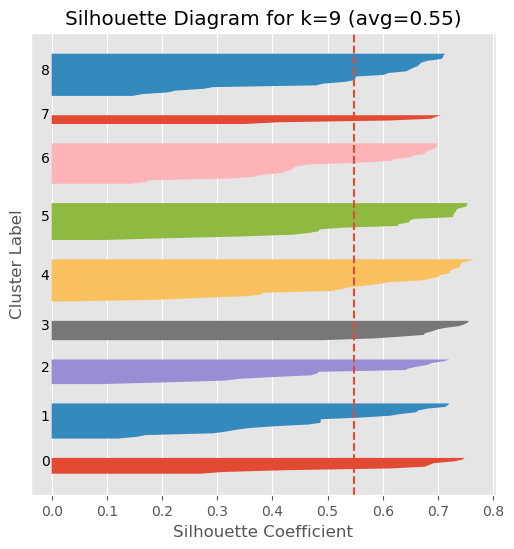

Average silhouette score for k=9: 0.547


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans

def plot_silhouette_diagram(df, features, k, random_state=0):
    """
    Plots a full silhouette diagram for KMeans clustering.

    Parameters
    ----------
    df : pandas.DataFrame
        DataFrame containing descriptor features.
    features : list of str
        Columns in df to use for clustering.
    k : int
        Number of clusters.
    random_state : int
        Random seed for reproducibility.

    Returns
    -------
    sil_avg : float
        Average silhouette score.
    """
    X = df[features].values
    km = KMeans(n_clusters=k, random_state=random_state)
    labels = km.fit_predict(X)
    sil_avg = silhouette_score(X, labels)
    sil_vals = silhouette_samples(X, labels)

    fig, ax = plt.subplots(figsize=(6, 6))
    y_lower = 10

    for i in range(k):
        cluster_vals = sil_vals[labels == i]
        cluster_vals.sort()
        size = cluster_vals.shape[0]
        y_upper = y_lower + size

        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, cluster_vals)
        ax.text(-0.02, y_lower + 0.5 * size, str(i))
        y_lower = y_upper + 10  # 10 for spacing between clusters

    ax.axvline(x=sil_avg, linestyle='--')
    ax.set_xlabel('Silhouette Coefficient')
    ax.set_ylabel('Cluster Label')
    ax.set_yticks([])  # clear y-axis labels
    ax.set_title(f'Silhouette Diagram for k={k} (avg={sil_avg:.2f})')
    plt.show()

    return sil_avg


features = ['mean_amp','std_amp','rms_amp','env_mean','dom_freq','grad_mean']
for i in range(2, 10):
    sil_score = plot_silhouette_diagram(df, features, k=i)
    print(f"Average silhouette score for k={i}: {sil_score:.3f}")



---